# **EDA and Hypothesis Testing of Climatic Variables (Part 2)**

In [1]:
# Libraries
import pandas as pd
import numpy as np
from scipy.stats import skew, kurtosis, spearmanr, pearsonr
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import Image, display

# Data
df = pd.read_csv('AVONETplusClim.csv' )

## **3. Beak Size (Beak Length)**

First of all, distribution of beak length is explored using histograms, as well as skewness and kurtosis. For the raw data: 

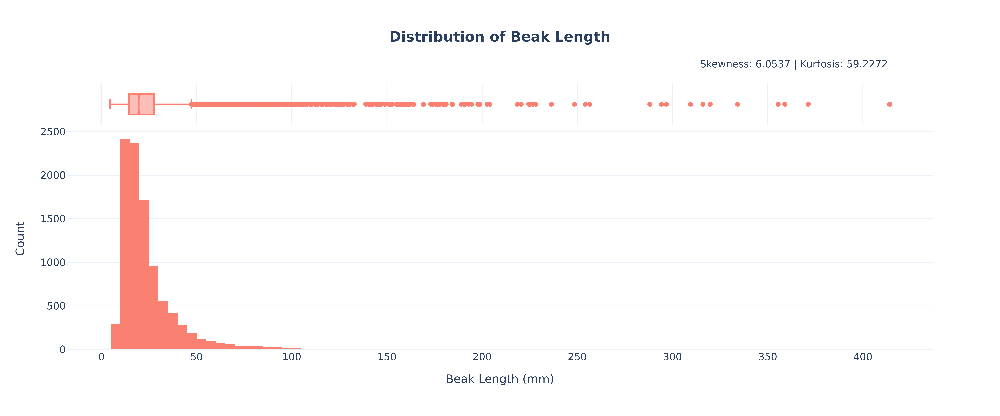

In [2]:
s = skew(df['Beak.Length_Culmen'])
k = kurtosis(df['Beak.Length_Culmen'])

fig = px.histogram(
    df, 
    x='Beak.Length_Culmen', 
    nbins=100, 
    title='<b>Distribution of Beak Length</b>',
    marginal='box',
    color_discrete_sequence=['salmon']
)

fig.add_annotation(
    text=f"Skewness: {s:.4f} | Kurtosis: {k:.4f}",
    xref="paper", yref="paper",
    x=0.95, y=1.1,
    showarrow=False,
    font=dict(size=12)
)

fig.update_layout(
    title_x=0.5,
    yaxis_title="Count",
    xaxis_title="Beak Length (mm)",
    template="plotly_white",
    width=1200,
    height=500
)

fig.write_image("Beak_Raw_Histogram.png", scale=5)
display(Image("Beak_Raw_Histogram.png"))

The data is extremely right-skewed. To approach a biologically meaningful distribution and improve the visualization, log-transformation is applied. Skewness and kurtosis are calculated.

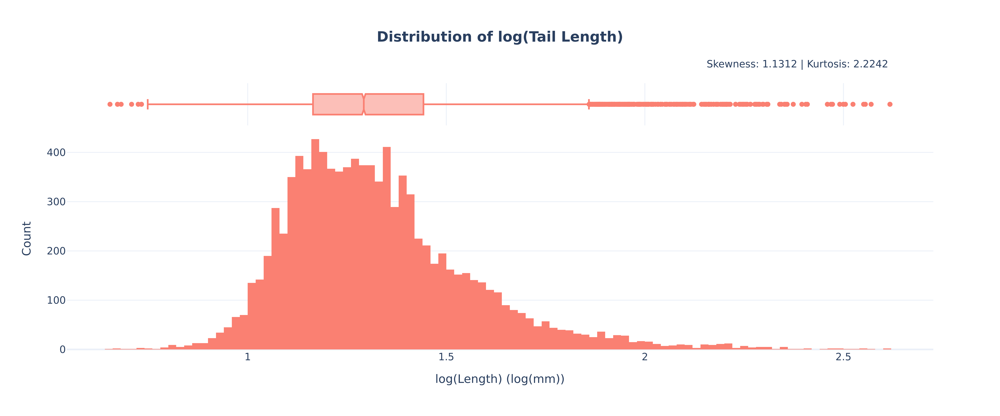

In [3]:
df_clean = df[(df['Beak.Length_Culmen'] > 0.1) & (df['Beak.Length_Culmen'] < 535)].copy()
df_clean['Log_Beak'] = np.log10(df_clean['Beak.Length_Culmen'])

fig = px.histogram(
    df_clean, 
    x='Log_Beak', 
    title='<b>Distribution of log(Tail Length)</b>', 
    nbins=100, 
    marginal='box',
    color_discrete_sequence=['salmon']
)

s = skew(df_clean['Log_Beak'])
k = kurtosis(df_clean['Log_Beak'])

fig.add_annotation(
    text=f"Skewness: {s:.4f} | Kurtosis: {k:.4f}",
    xref="paper", yref="paper",
    x=0.95, y=1.1,
    showarrow=False,
    font=dict(size=12)
)

fig.update_layout(
    title_x=0.5, 
    xaxis_title="log(Length) (log(mm))", 
    yaxis_title="Count", 
    template="plotly_white",
    width=1200,
    height=500
)

fig.write_image("Beak_Log_Histogram.png", scale=5)
display(Image("Beak_Log_Histogram.png"))

Since kurtosis > 2, it is not safe to assume normal distribution. Therefore, log transformation is kept only for visualization.

### **3.1. Beak Length and Temperature**

Since neither beak length nor temperature is normally distributed, Spearman's rank correlation coefficient is used.

For minimum temperature:

* H0: There is no correlation between beak length and minimum temperature.
* H1: There is a correlation between beak length and minimum temperature. 

In [4]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Min.Temperature'], df_clean['Beak.Length_Culmen'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: 0.0492
p-value: 9.7508e-07


For maximum temperature:

* H0: There is no correlation between tail length and maximum temperature.
* H1: There is a correlation between tail length and maximum temperature.

In [5]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Max.Temperature'], df_clean['Beak.Length_Culmen'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: 0.0242
p-value: 1.6180e-02


For average temperature:

* H0: There is no correlation between tail length and average temperature.
* H1: There is a correlation between tail length and average temperature.

In [6]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Mean.Temperature'], df_clean['Beak.Length_Culmen'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: 0.0456
p-value: 5.7400e-06


For minimum, maximum, and average temperature, p << 0.05, thus the null hypotheses are rejected. Overall, there is a statistically significant relationship between beak length and temperature. To illustrate the relationships, scatter plots are created:

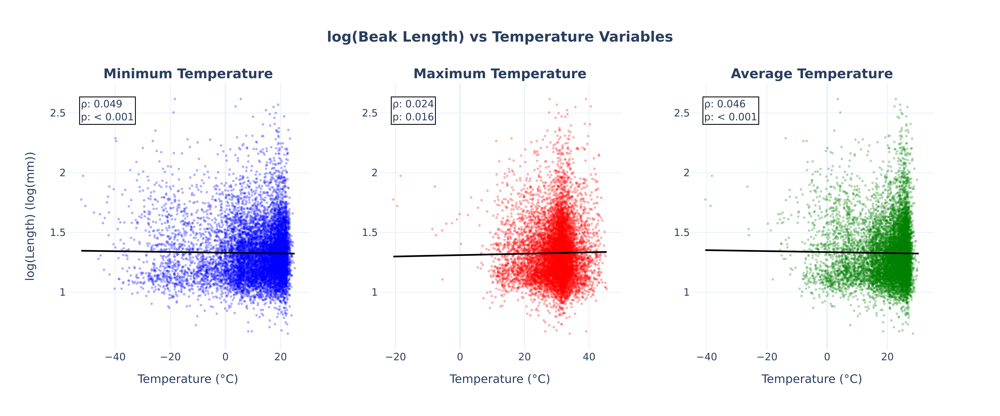

In [7]:
color_map = {
    'Min.Temperature': 'blue',
    'Max.Temperature': 'red',
    'Mean.Temperature': 'green'
}

fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=("<b>Minimum Temperature</b>", "<b>Maximum Temperature</b>", "<b>Average Temperature</b>"),
    horizontal_spacing=0.08
)

for i, var in enumerate(['Min.Temperature', 'Max.Temperature', 'Mean.Temperature']):
    x_data = df_clean[var]
    y_data = df_clean['Log_Beak']

    rho, p_val = spearmanr(x_data, y_data)
    p_text = "< 0.001" if p_val < 0.001 else f"{p_val:.3f}"

    fig.add_trace(
        go.Scatter(
            x=x_data, y=y_data, 
            mode='markers', 
            marker=dict(size=3, color=color_map[var], opacity=0.3),
            showlegend=False
        ),
        row=1, col=i+1
    )

    m, b = np.polyfit(x_data, y_data, 1)
    x_line = np.linspace(x_data.min(), x_data.max(), 100)
    y_line = m * x_line + b
    
    fig.add_trace(
        go.Scatter(
            x=x_line, y=y_line, 
            mode='lines', 
            line=dict(color='black', width=2),
            showlegend=False
        ),
        row=1, col=i+1
    )

    xref_val = "x domain" if i == 0 else f"x{i+1} domain"
    yref_val = "y domain" if i == 0 else f"y{i+1} domain"

    fig.add_annotation(
        text=f"ρ: {rho:.3f}<br>p: {p_text}",
        xref=xref_val, yref=yref_val,
        x=0.05, y=0.95,
        showarrow=False,
        bgcolor="white",
        bordercolor="black",
        font=dict(size=12),
        align="left"
    )

    fig.update_xaxes(title_text="Temperature (°C)", row=1, col=i+1)

fig.update_yaxes(title_text="log(Length) (log(mm))", row=1, col=1)
fig.update_layout(
    title_text="<b>log(Beak Length) vs Temperature Variables</b>",
    title_x=0.5,
    height=500,
    width=1200,
    template="plotly_white"
)

fig.write_image("Beak_Temperature.png", scale=5)
display(Image("Beak_Temperature.png"))

### **3.2. Beak Length and Precipitation**

Since beak length is not normally distributed, Spearman test is used, in which

* H0: There is no monotonic relationship between beak length and precipitation.
* H1: There is a monotonic relationship between beak length and precipitation.

In [8]:
correlation_rho, p_value_spearman = spearmanr(df['Mean.Precipitation'], df['Beak.Length_Culmen'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: 0.0499
p-value: 7.1455e-07


Since p < 0.05, the null hypothesis (H0) is rejected. There is a statistically significant relationship between beak length and precipitation. To illustrate the relationship, a scatter plot is created.

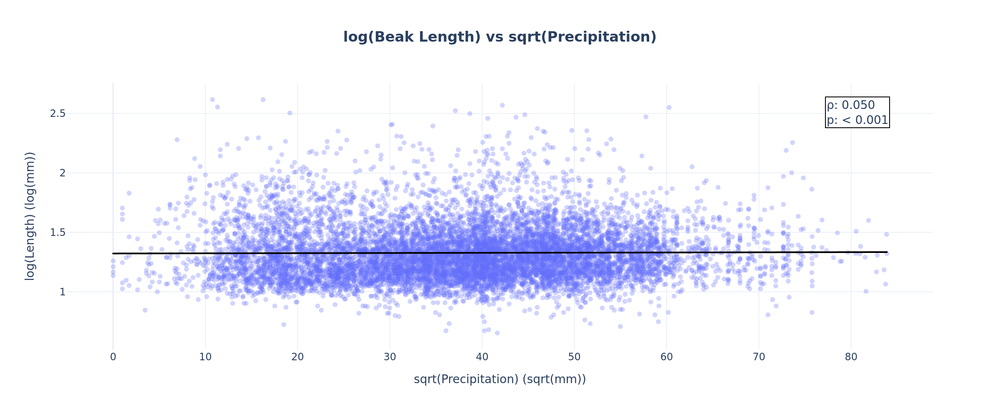

In [9]:
df_clean['Sqrt_Precip'] = np.sqrt(df_clean['Mean.Precipitation']).copy()

corr, p_val = spearmanr(df_clean['Log_Beak'], df_clean['Sqrt_Precip'])
p_text = "< 0.001" if p_val < 0.001 else f"{p_val:.3f}"

fig = px.scatter(
    df_clean, 
    x='Sqrt_Precip', 
    y='Log_Beak', 
    trendline='ols', 
    trendline_color_override='black',
    title='<b>log(Beak Length) vs sqrt(Precipitation)</b>',
    labels={'Sqrt_Precip': 'sqrt(Precipitation) (sqrt(mm))', 'Log_Beak': 'log(Length) (log(mm))'},
    opacity=0.3,
    template='plotly_white'
)

fig.add_annotation(
    text=f"ρ: {corr:.3f}<br>p: {p_text}",
    xref="paper", yref="paper",
    x=0.95, y=0.95,
    showarrow=False,
    bgcolor="rgba(255, 255, 255, 0.8)", bordercolor="black", borderwidth=1,
    font=dict(size=14),
    align="left"
)

fig.update_layout(
    title_x=0.5,
    width=1200,
    height=500
)

fig.write_image("Beak_Precipitation.png", scale=2)
display(Image("Beak_Precipitation.png"))

## **4. Wing Size and Shape (Wing Length and Hand-Wing Index)**

### **4.1. Wing Length and Temperature**

First of all, distribution of wing length is explored using histograms, as well as skewness and kurtosis. For the raw data: 

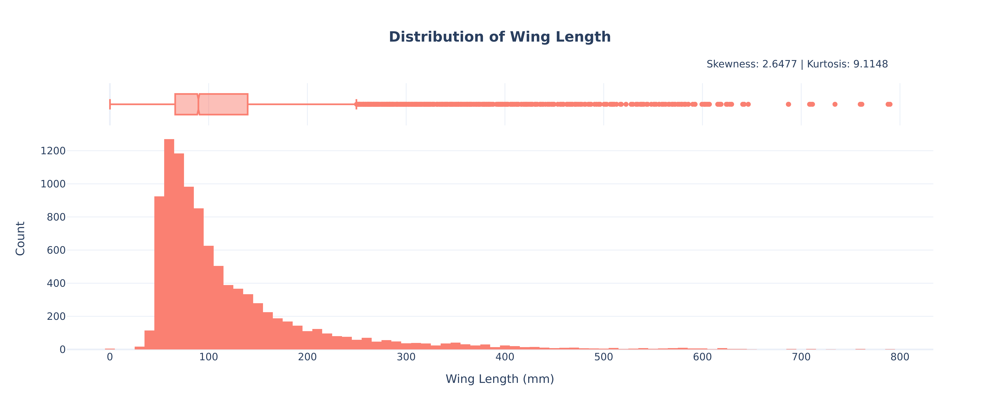

In [10]:
s = skew(df_clean['Wing.Length'])
k = kurtosis(df_clean['Wing.Length'])

fig = px.histogram(
    df_clean, 
    x='Wing.Length', 
    nbins=100, 
    title='<b>Distribution of Wing Length</b>',
    marginal='box',
    color_discrete_sequence=['salmon']
)

fig.add_annotation(
    text=f"Skewness: {s:.4f} | Kurtosis: {k:.4f}",
    xref="paper", yref="paper",
    x=0.95, y=1.1,
    showarrow=False,
    font=dict(size=12)
)

fig.update_layout(
    title_x=0.5,
    yaxis_title="Count",
    xaxis_title="Wing Length (mm)",
    template="plotly_white",
    width=1200,
    height=500
)

fig.write_image("Wing_Raw_Histogram.png", scale=5)
display(Image("Wing_Raw_Histogram.png"))

The data is extremely right-skewed. In addition, there are 10 outliers that disrupt the visualization (>650 mm). To approach a biologically meaningful distribution and improve the visualization, log-transformation is applied. Additionally, the outliers are excluded since they make up a negligible fraction of the dataset (10/9878). Skewness and kurtosis are calculated.

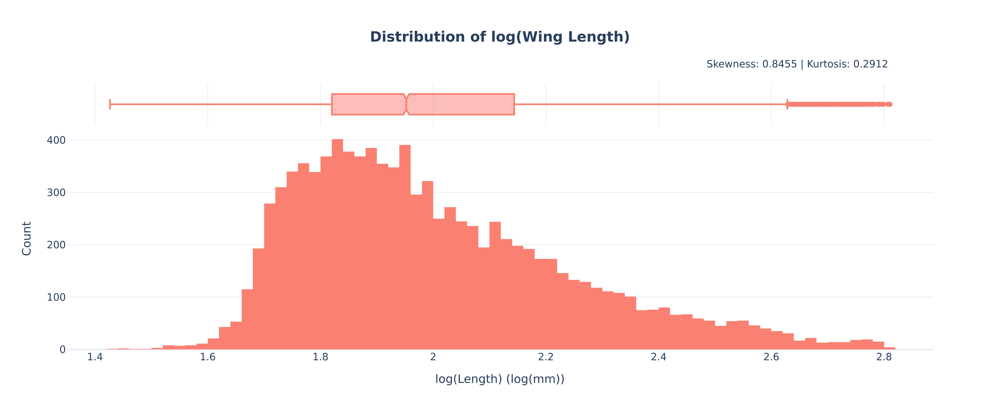

In [11]:
df_clean = df[(df['Wing.Length'] > 0.1) & (df['Wing.Length'] < 650)].copy()
df_clean['Log_Wing'] = np.log10(df_clean['Wing.Length'])

fig = px.histogram(
    df_clean, 
    x='Log_Wing', 
    title='<b>Distribution of log(Wing Length)</b>', 
    nbins=100, 
    marginal='box',
    color_discrete_sequence=['salmon']
)

s = skew(df_clean['Log_Wing'])
k = kurtosis(df_clean['Log_Wing'])

fig.add_annotation(
    text=f"Skewness: {s:.4f} | Kurtosis: {k:.4f}",
    xref="paper", yref="paper",
    x=0.95, y=1.1,
    showarrow=False,
    font=dict(size=12)
)

fig.update_layout(
    title_x=0.5, 
    xaxis_title="log(Length) (log(mm))", 
    yaxis_title="Count", 
    template="plotly_white",
    width=1200,
    height=500
)

fig.write_image("Wing_Log_Histogram.png", scale=5)
display(Image("Wing_Log_Histogram.png"))

Both skewness and kurtosis fall between -1 and 1, thus the distribution is safe to assume to be normal.

Since temperature is not normally distributed, Spearman's rank correlation coefficient is used.

For minimum temperature:

* H0: There is no correlation between wing length and minimum temperature.
* H1: There is a correlation between wing length and minimum temperature. 

In [12]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Min.Temperature'], df_clean['Wing.Length'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: -0.0643
p-value: 1.6197e-10


For maximum temperature:

* H0: There is no correlation between wing length and maximum temperature.
* H1: There is a correlation between wing length and maximum temperature.

In [13]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Max.Temperature'], df_clean['Wing.Length'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: 0.0313
p-value: 1.9102e-03


For average temperature:

* H0: There is no correlation between wing length and average temperature.
* H1: There is a correlation between wing length and average temperature.

In [14]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Mean.Temperature'], df_clean['Wing.Length'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: -0.0317
p-value: 1.6321e-03


For minimum, maximum, and average temperature, p << 0.05, thus the null hypotheses are rejected. Overall, there is a statistically significant relationship between wing length and temperature. To illustrate the relationships, scatter plots are created:

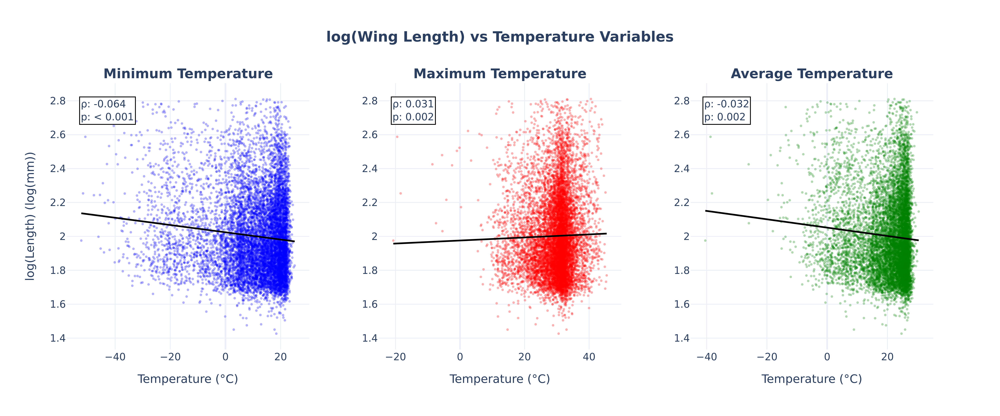

In [15]:
color_map = {
    'Min.Temperature': 'blue',
    'Max.Temperature': 'red',
    'Mean.Temperature': 'green'
}

fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=("<b>Minimum Temperature</b>", "<b>Maximum Temperature</b>", "<b>Average Temperature</b>"),
    horizontal_spacing=0.08
)

for i, var in enumerate(['Min.Temperature', 'Max.Temperature', 'Mean.Temperature']):
    x_data = df_clean[var]
    y_data = df_clean['Log_Wing']

    rho, p_val = spearmanr(x_data, y_data)
    p_text = "< 0.001" if p_val < 0.001 else f"{p_val:.3f}"

    fig.add_trace(
        go.Scatter(
            x=x_data, y=y_data, 
            mode='markers', 
            marker=dict(size=3, color=color_map[var], opacity=0.3),
            showlegend=False
        ),
        row=1, col=i+1
    )

    m, b = np.polyfit(x_data, y_data, 1)
    x_line = np.linspace(x_data.min(), x_data.max(), 100)
    y_line = m * x_line + b
    
    fig.add_trace(
        go.Scatter(
            x=x_line, y=y_line, 
            mode='lines', 
            line=dict(color='black', width=2),
            showlegend=False
        ),
        row=1, col=i+1
    )

    xref_val = "x domain" if i == 0 else f"x{i+1} domain"
    yref_val = "y domain" if i == 0 else f"y{i+1} domain"

    fig.add_annotation(
        text=f"ρ: {rho:.3f}<br>p: {p_text}",
        xref=xref_val, yref=yref_val,
        x=0.05, y=0.95,
        showarrow=False,
        bgcolor="white",
        bordercolor="black",
        font=dict(size=12),
        align="left"
    )

    fig.update_xaxes(title_text="Temperature (°C)", row=1, col=i+1)

fig.update_yaxes(title_text="log(Length) (log(mm))", row=1, col=1)
fig.update_layout(
    title_text="<b>log(Wing Length) vs Temperature Variables</b>",
    title_x=0.5,
    height=500,
    width=1200,
    template="plotly_white"
)

fig.write_image("Wing_Temperature.png", scale=5)
display(Image("Wing_Temperature.png"))

### **4.2. Hand-Wing Index (HWI) and Temperature**

First of all, distribution of HWI is explored using histograms, as well as skewness and kurtosis. For the raw data:

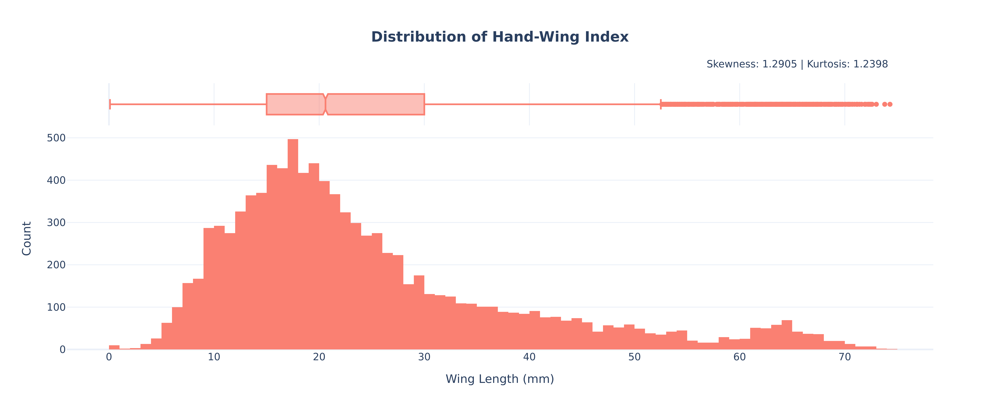

In [16]:
s = skew(df_clean['Hand-Wing.Index'])
k = kurtosis(df_clean['Hand-Wing.Index'])

fig = px.histogram(
    df_clean, 
    x='Hand-Wing.Index', 
    nbins=100, 
    title='<b>Distribution of Hand-Wing Index</b>',
    marginal='box',
    color_discrete_sequence=['salmon']
)

fig.add_annotation(
    text=f"Skewness: {s:.4f} | Kurtosis: {k:.4f}",
    xref="paper", yref="paper",
    x=0.95, y=1.1,
    showarrow=False,
    font=dict(size=12)
)

fig.update_layout(
    title_x=0.5,
    yaxis_title="Count",
    xaxis_title="Wing Length (mm)",
    template="plotly_white",
    width=1200,
    height=500
)

fig.write_image("HWI_Raw_Histogram.png", scale=5)
display(Image("HWI_Raw_Histogram.png"))

The data is right-skewed.To approach a biologically meaningful distribution and improve the visualization, log-transformation is applied. Skewness and kurtosis are calculated.

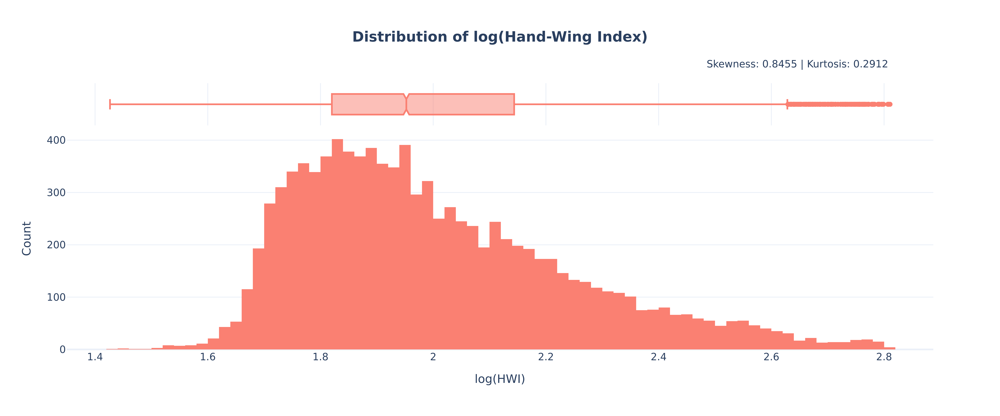

In [17]:
df_clean = df[(df['Wing.Length'] > 0.1) & (df['Wing.Length'] < 650)].copy()
df_clean['Log_HWI'] = np.log10(df_clean['Wing.Length'])

fig = px.histogram(
    df_clean, 
    x='Log_HWI', 
    title='<b>Distribution of log(Hand-Wing Index)</b>', 
    nbins=100, 
    marginal='box',
    color_discrete_sequence=['salmon']
)

s = skew(df_clean['Log_HWI'])
k = kurtosis(df_clean['Log_HWI'])

fig.add_annotation(
    text=f"Skewness: {s:.4f} | Kurtosis: {k:.4f}",
    xref="paper", yref="paper",
    x=0.95, y=1.1,
    showarrow=False,
    font=dict(size=12)
)

fig.update_layout(
    title_x=0.5, 
    xaxis_title="log(HWI)", 
    yaxis_title="Count", 
    template="plotly_white",
    width=1200,
    height=500
)

fig.write_image("HWI_Log_Histogram.png", scale=5)
display(Image("HWI_Log_Histogram.png"))

Both skewness and kurtosis fall between -1 and 1, thus the distribution is safe to assume to be normal.

Since temperature is not normally distributed, Spearman's rank correlation coefficient is used.

For minimum temperature:

* H0: There is no correlation between HWI and minimum temperature.
* H1: There is a correlation between HWI and minimum temperature. 

In [18]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Min.Temperature'], df_clean['Hand-Wing.Index'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: -0.1673
p-value: 7.5759e-63


For maximum temperature:

* H0: There is no correlation between HWI and maximum temperature.
* H1: There is a correlation between HWI and maximum temperature.

In [19]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Max.Temperature'], df_clean['Hand-Wing.Index'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: 0.0007
p-value: 9.4194e-01


For average temperature:

* H0: There is no correlation between wing length and average temperature.
* H1: There is a correlation between wing length and average temperature.

In [20]:
correlation_rho, p_value_spearman = spearmanr(df_clean['Mean.Temperature'], df_clean['Hand-Wing.Index'])

print(f"Spearman rho: {correlation_rho:.4f}")
print(f"p-value: {p_value_spearman:.4e}")

Spearman rho: -0.1227
p-value: 2.2727e-34


For minimum and average temperature, p < 0.05, thus the null hypotheses are rejected. There is a statistically significant relationship between mass and minimum temperature, as well as average temperature. However, for maximum temperature, p > 0.05, thus the null hypothesis is failed to reject. To illustrate the relationships, scatter plots are created:

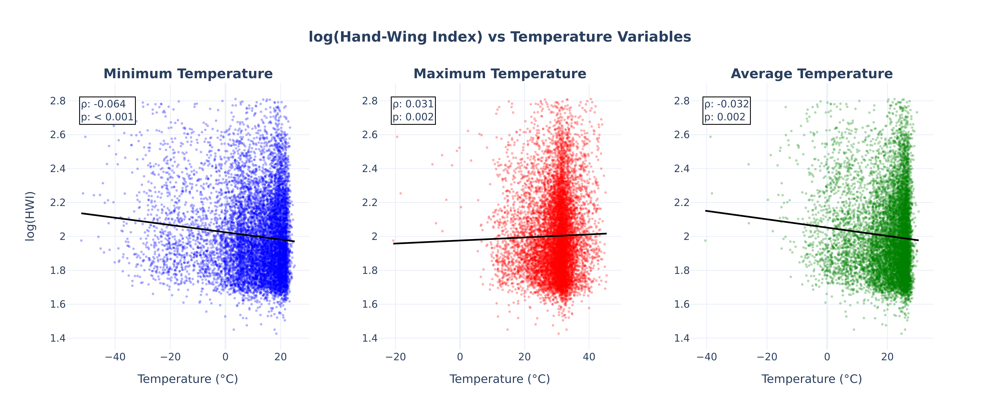

In [21]:
color_map = {
    'Min.Temperature': 'blue',
    'Max.Temperature': 'red',
    'Mean.Temperature': 'green'
}

fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=("<b>Minimum Temperature</b>", "<b>Maximum Temperature</b>", "<b>Average Temperature</b>"),
    horizontal_spacing=0.08
)

for i, var in enumerate(['Min.Temperature', 'Max.Temperature', 'Mean.Temperature']):
    x_data = df_clean[var]
    y_data = df_clean['Log_HWI']

    rho, p_val = spearmanr(x_data, y_data)
    p_text = "< 0.001" if p_val < 0.001 else f"{p_val:.3f}"

    fig.add_trace(
        go.Scatter(
            x=x_data, y=y_data, 
            mode='markers', 
            marker=dict(size=3, color=color_map[var], opacity=0.3),
            showlegend=False
        ),
        row=1, col=i+1
    )

    m, b = np.polyfit(x_data, y_data, 1)
    x_line = np.linspace(x_data.min(), x_data.max(), 100)
    y_line = m * x_line + b
    
    fig.add_trace(
        go.Scatter(
            x=x_line, y=y_line, 
            mode='lines', 
            line=dict(color='black', width=2),
            showlegend=False
        ),
        row=1, col=i+1
    )

    xref_val = "x domain" if i == 0 else f"x{i+1} domain"
    yref_val = "y domain" if i == 0 else f"y{i+1} domain"

    fig.add_annotation(
        text=f"ρ: {rho:.3f}<br>p: {p_text}",
        xref=xref_val, yref=yref_val,
        x=0.05, y=0.95,
        showarrow=False,
        bgcolor="white",
        bordercolor="black",
        font=dict(size=12),
        align="left"
    )

    fig.update_xaxes(title_text="Temperature (°C)", row=1, col=i+1)

fig.update_yaxes(title_text="log(HWI)", row=1, col=1)
fig.update_layout(
    title_text="<b>log(Hand-Wing Index) vs Temperature Variables</b>",
    title_x=0.5,
    height=500,
    width=1200,
    template="plotly_white"
)

fig.write_image("HWI_Temperature.png", scale=5)
display(Image("HWI_Temperature.png"))